In [1]:
import tensorflow as tf

import os
import time

from matplotlib import pyplot as plt
from IPython import display
import pickle

import numpy as np

In [2]:
infile = open('nvbd.pickle','rb')
ALL_DATA = pickle.load(infile)
infile.close()

In [3]:
print(f"X_train shape =  {ALL_DATA['X_train'].shape}")
print(f"y_train shape =  {ALL_DATA['y_train'].shape}")

print(f"X_test1 shape =  {ALL_DATA['X_test1'].shape}")
print(f"y_test1 shape =  {ALL_DATA['y_test1'].shape}")

print(f"X_test2 shape =  {ALL_DATA['X_test2'].shape}")
print(f"y_test2 shape =  {ALL_DATA['y_test2'].shape}")

X_train shape =  (6942, 1, 64, 64)
y_train shape =  (6942, 1, 64, 64)
X_test1 shape =  (868, 1, 64, 64)
y_test1 shape =  (868, 1, 64, 64)
X_test2 shape =  (868, 1, 64, 64)
y_test2 shape =  (868, 1, 64, 64)


In [4]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters,
                                      size, strides=2,
                                      padding='same',
                                      #kernel_initializer=initializer,
                                      use_bias=False))
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result

In [5]:
down_model = downsample(5, 10)
down_result = down_model(tf.expand_dims(ALL_DATA['X_train'][0], 0))
print (down_result.shape)
#down_model.summary()

(1, 1, 32, 5)


In [6]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    #kernel_initializer=initializer,
                                    use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

In [7]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 2, 64, 3)


In [8]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[64, 64, 1])
    down_stack = [
    #downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
    #downsample(128, 4),  # (bs, 64, 64, 128)
    #downsample(256, 4),  # (bs, 32, 32, 256)
    #downsample(512, 4),  # (bs, 16, 16, 512)
    #downsample(512, 4),  # (bs, 8, 8, 512)
    #downsample(512, 4),  # (bs, 4, 4, 512)
    #downsample(512, 4),  # (bs, 2, 2, 512)
    #downsample(512, 4),]  # (bs, 1, 1, 512)
    downsample(32, 2),  # (bs, 8, 8, 512)
    downsample(64, 2),  # (bs, 4, 4, 512)
    downsample(128, 2),# (bs, 2, 2, 512)
    downsample(128, 2),
    downsample(128, 2),]  # (bs, 1, 1, 512)
    
        
        
        
    up_stack = [
    #upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
    #upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
    #upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
    #upsample(512, 4),  # (bs, 16, 16, 1024)
    #upsample(256, 4),  # (bs, 32, 32, 512)
    #upsample(128, 4),  # (bs, 64, 64, 256)
    #upsample(64, 4),]  # (bs, 128, 128, 128)
    upsample(128, 2),  # (bs, 16, 16, 1024)
    upsample(128, 2),  # (bs, 32, 32, 512)
    upsample(128, 2),  # (bs, 64, 64, 256)
    upsample(64, 2),  # (bs, 64, 64, 256)
    upsample(32, 2),]  # (bs, 128, 128, 128)
    
        
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

In [9]:
OUTPUT_CHANNELS = 1

generator = Generator()

In [10]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [11]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    # mean absolute error
    #l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    #total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return gan_loss #, total_gen_loss, l1_loss

In [12]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[64, 64, 1], name='input_image')
    tar = tf.keras.layers.Input(shape=[64, 64, 1], name='target_image')
    x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)
    down1 = downsample(16, 2, False)(x)  # (bs, 128, 128, 64)
    down2 = downsample(32, 2)(down1)  # (bs, 64, 64, 128)
    down3 = downsample(64, 2)(down2)  # (bs, 32, 32, 256)
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(64, 2, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)
    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)
    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)
    return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [13]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

In [14]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [15]:
discriminator = Discriminator()
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [16]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))
    display_list = [test_input[0], tar[0], prediction[0][:,:,0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    #plt.imshow(display_list[2][:,:,0], cmap = 'gray')
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5,cmap="gray")
        plt.axis('off')
    plt.show()

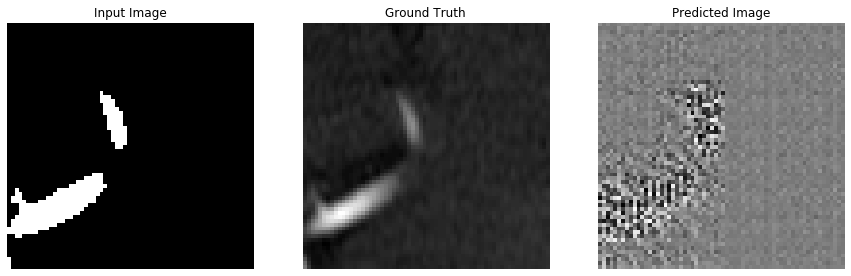

In [17]:
#generate_images(generator, tf.expand_dims(image_s_train[0]/1.0,0), tf.expand_dims(image_r_train[0]/1.0,0))
generate_images(generator, ALL_DATA['y_train'][0], ALL_DATA['X_train'][0])


In [18]:
#pred = pred.reshape((868,64*64))
from scipy.linalg import sqrtm

def calculate_fid(act1, act2):
    # calculate mean and covariance statistics
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    # calculate sum squared difference between means
    ssdiff = np.sum((mu1 - mu2)**2.0)
    # calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))
    # check and correct imaginary numbers from sqrt
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    # calculate score
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

In [19]:
EPOCHS = 150

In [20]:
import datetime
log_dir="logs_crop/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [21]:
#@tf.function
def train_step(input_image, target, epoch,i):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)
        gen_gan_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    generator_gradients = gen_tape.gradient(gen_gan_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
    if i % (len(X_train)-1) == 0 and i!=0:
        
        with summary_writer.as_default():
            #tf.summary.scalar('gen_total_loss', gen_total_loss, step=i)
            #tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=i)
            #tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=i)
            #tf.summary.scalar('disc_loss', disc_loss, step=i)
            #list_gen_total_loss.append(gen_total_loss)
            list_gen_gan_loss.append(gen_gan_loss)
            #list_gen_l1_loss.append(gen_l1_loss)
            list_disc_loss.append(disc_loss)

            fid=[]
            for i in range(len(y_test2)):
                pred = generator(y_test2[i])
                fid.append(calculate_fid(np.array(pred[0][:,:,0]), X_test2[i][0]))
                #p = generator(y_test2[i])
                #pred[i] = np.array(p).reshape((1,64,64))
            #pred = pred.reshape((868,64*64))
            fid_list.append(np.mean(fid))
    template = 'epoch {}, gen_gan_loss: {:.2f}, disc_loss: {:.2f}'
    print (template.format(epoch+1,
                         gen_gan_loss,
                         disc_loss))
   

In [22]:
def fit(train_ds, epochs, test_ds):
    for epoch in range(epochs):
        start = time.time()
        display.clear_output(wait=True)
        for example_input, example_target in test_ds:
            generate_images(generator, example_input, example_target)
        print("Epoch: ", epoch)
        # Train
        for (input_image, target) in train_ds:
            print('.', end='')
            #if (n+1) % 100 == 0:
                #print()
            train_step(input_image, target, epoch)
        print()
        # saving (checkpoint) the model every 20 epochs
        if (epoch + 1) % 20 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)
        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
    checkpoint.save(file_prefix=checkpoint_prefix)

In [23]:
fid_list = []
#list_gen_total_loss = []
list_gen_gan_loss = []
#list_gen_l1_loss = []
list_disc_loss = []
X_train, y_train = ALL_DATA['X_train'], ALL_DATA['y_train']
X_test1, y_test1 = ALL_DATA['X_test1'], ALL_DATA['y_test1']
X_test2, y_test2 = ALL_DATA['X_test2'], ALL_DATA['y_test2']

In [24]:
#X_test2 = X_test2.reshape((868,64,64))
#X_test2 = X_test2.reshape((868,64*64))


In [25]:
for epoch in range(40):
    n=0
    step = 0
    for input_image, target in zip(y_train.astype('float32'),X_train.astype('float32')):
        train_step(input_image, target, epoch, n)
        n = n + 1

epoch 1, gen_gan_loss: 0.86, disc_loss: 1.45
epoch 1, gen_gan_loss: 0.78, disc_loss: 1.47
epoch 1, gen_gan_loss: 0.76, disc_loss: 1.43
epoch 1, gen_gan_loss: 0.78, disc_loss: 1.43
epoch 1, gen_gan_loss: 0.78, disc_loss: 1.45
epoch 1, gen_gan_loss: 0.77, disc_loss: 1.42
epoch 1, gen_gan_loss: 0.75, disc_loss: 1.40
epoch 1, gen_gan_loss: 0.73, disc_loss: 1.43
epoch 1, gen_gan_loss: 0.72, disc_loss: 1.42
epoch 1, gen_gan_loss: 0.72, disc_loss: 1.44
epoch 1, gen_gan_loss: 0.69, disc_loss: 1.44
epoch 1, gen_gan_loss: 0.74, disc_loss: 1.44
epoch 1, gen_gan_loss: 0.69, disc_loss: 1.46
epoch 1, gen_gan_loss: 0.71, disc_loss: 1.43
epoch 1, gen_gan_loss: 0.72, disc_loss: 1.40
epoch 1, gen_gan_loss: 0.72, disc_loss: 1.42
epoch 1, gen_gan_loss: 0.68, disc_loss: 1.45
epoch 1, gen_gan_loss: 0.71, disc_loss: 1.45
epoch 1, gen_gan_loss: 0.67, disc_loss: 1.47
epoch 1, gen_gan_loss: 0.70, disc_loss: 1.44
epoch 1, gen_gan_loss: 0.70, disc_loss: 1.42
epoch 1, gen_gan_loss: 0.68, disc_loss: 1.42
epoch 1, g

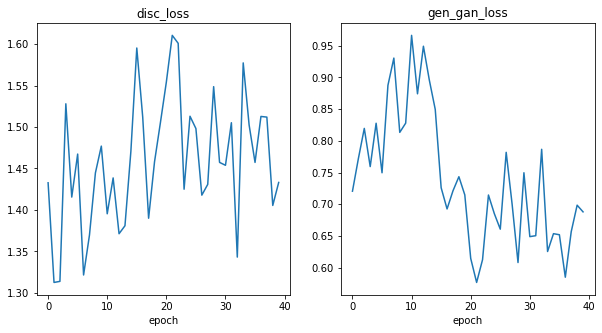

In [40]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10,5))
#axs[1,0].plot(list_gen_total_loss)
#axs[1,0].set_title('gen_total_loss')
#axs[1,0].set_xlabel('epoch')

axs[0].plot(list_disc_loss)
axs[0].set_title('disc_loss')
axs[0].set_xlabel('epoch')

axs[1].plot(list_gen_gan_loss) 
axs[1].set_title('gen_gan_loss')
axs[1].set_xlabel('epoch')

#axs[0,0].plot(list_gen_l1_loss)
#axs[0,0].set_title('gen_l1_loss')
#axs[0,0].set_xlabel('epoch')


fig.savefig('64x64gan1.png')
plt.show()



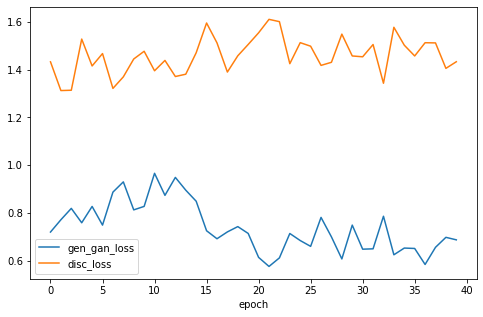

In [35]:
import pandas as pd
d ={
    'gen_gan_loss':list_gen_gan_loss,
    
    'disc_loss':list_disc_loss}
df = pd.DataFrame(data = d, dtype = np.float32)
fig = df.plot(figsize=(8, 5))
plt.xlabel('epoch')
#plt.savefig('64x64_2.png')
plt.show()

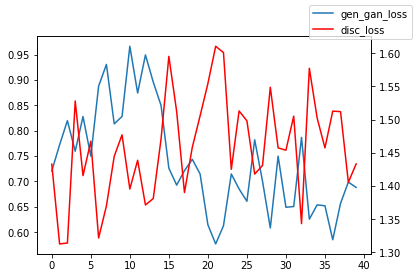

In [39]:
import pandas as pd
import matplotlib.pyplot as plt


ax = df.plot( y="gen_gan_loss", legend=False)
ax2 = ax.twinx()
df.plot( y="disc_loss", ax=ax2, legend=False, color="r")
ax.figure.legend()
plt.savefig('64x64gan.png')
plt.show()

Text(0.5, 1.0, 'test validation fid')

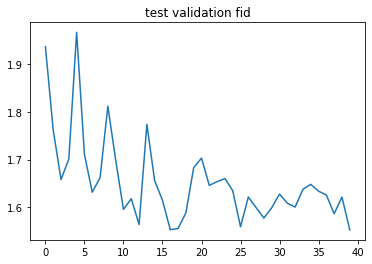

In [41]:
plt.plot(fid_list)
plt.title('test validation fid')

In [ ]:
#for i in range(len(y_test1)):
    #generate_images(generator, y_test1[i], X_test1[i])

In [42]:
generator.save("./model64x64_gan")


INFO:tensorflow:Assets written to: ./model64x64_gan\assets


78## from IPython.display import FileLinks
FileLinks(r"./model")